## ASR Evaluation

### English

In [33]:
import subprocess
%cd ../../DeepSpeech
cmd ="""python2.7 -u infer.py \
--num_samples=10 \
--beam_size=500 \
--num_proc_bsearch=8 \
--num_conv_layers=2 \
--num_rnn_layers=3 \
--rnn_layer_size=1024 \
--alpha=1.4 \
--beta=0.35 \
--cutoff_prob=0.99 \
--cutoff_top_n=40 \
--use_gru=True \
--use_gpu=False \
--share_rnn_weights=False \
--infer_manifest='./data/private_en/manifest.test' \
--mean_std_path='./models/baidu_en8k/mean_std.npz' \
--vocab_path='./models/baidu_en8k/vocab.txt' \
--model_path='./models/baidu_en8k' \
--lang_model_path='./models/lm/common_crawl_00.prune01111.trie.klm' \
--decoding_method='ctc_beam_search' \
--error_rate_type='wer,sen_sim' \
--specgram_type='linear' \
--language='eng'"""
try :
    output = subprocess.run(cmd,shell=True,check=True,stdout=subprocess.PIPE)
    if output.returncode is not 0:
        raise Exception('fail to execute command!!!')
    result = bytes.decode(output.stdout).strip()
#     print(result)
    
finally:
    %cd ../MTS_zhu/evaluation/

/data/jerik/DeepSpeech
finish initing model from pretrained params from ./models/baidu_en8k
Target Transcription: for a long time i've wanted to do a video about tucker carlson perhaps the most famous anchor on fox news
Output Transcription: 
wer:1.000000
sen_sim:1.000000
Target Transcription: today i'm doing just that only under different circumstances than i expected
Output Transcription: today i'm doing just that only under different circumstances than i expected
wer:0.000000
sen_sim:0.000000
Target Transcription: let's take a look
Output Transcription: let's take look
wer:0.250000
sen_sim:0.091992
Target Transcription: it starts out just how you would expect it to
Output Transcription: it starts out just how you would expect it to
wer:0.000000
sen_sim:0.000000
Target Transcription: welcome america has killed a general in iran
Output Transcription: well gcom 
wer:1.000000
sen_sim:0.848698
Target Transcription: then he outlines sort of who the general was
Output Transcription: then h

In [34]:
results = result.split('\n')[1:]
num = int(len(results)/4)
result_dicts=[]
for i in range(num):
    keys=[]
    vals=[]
    for j in results[i*4:(i+1)*4]:
        k,v = j.split(':')
        keys.append(k)
        vals.append(v)
    result_dicts.append(dict(zip(keys,vals)))
result_dicts

[{'Target Transcription': " for a long time i've wanted to do a video about tucker carlson perhaps the most famous anchor on fox news",
  'Output Transcription': ' ',
  'wer': '1.000000',
  'sen_sim': '1.000000'},
 {'Target Transcription': " today i'm doing just that only under different circumstances than i expected",
  'Output Transcription': " today i'm doing just that only under different circumstances than i expected",
  'wer': '0.000000',
  'sen_sim': '0.000000'},
 {'Target Transcription': " let's take a look",
  'Output Transcription': " let's take look",
  'wer': '0.250000',
  'sen_sim': '0.091992'},
 {'Target Transcription': ' it starts out just how you would expect it to',
  'Output Transcription': ' it starts out just how you would expect it to',
  'wer': '0.000000',
  'sen_sim': '0.000000'},
 {'Target Transcription': ' welcome america has killed a general in iran',
  'Output Transcription': ' well gcom ',
  'wer': '1.000000',
  'sen_sim': '0.848698'},
 {'Target Transcriptio

### Chinese

In [3]:
%cd ../../DeepSpeech
!python2.7 -u  infer.py \
--num_samples=10 \
--beam_size=1000 \
--num_proc_bsearch=8 \
--num_conv_layers=2 \
--num_rnn_layers=3 \
--rnn_layer_size=2048 \
--alpha=2.6 \
--beta=5.0 \
--cutoff_prob=0.99 \
--cutoff_top_n=40 \
--use_gru=True \
--use_gpu=False \
--share_rnn_weights=False \
--infer_manifest='/data/jerik/MTS_zhu/notebooks/output/manifest.test' \
--mean_std_path='./models/baidu_cn1.2k/mean_std.npz' \
--vocab_path='./models/baidu_cn1.2k/vocab.txt' \
--model_path='./models/baidu_cn1.2k' \
--lang_model_path='./models/lm/zhidao_giga.klm' \
--decoding_method='ctc_beam_search' \
--error_rate_type='cer,sen_sim' \
--specgram_type='linear' \
--language='zh'
%cd ../MTS_zhu/evaluation/

/data/jerik/DeepSpeech
/usr/local/lib/python2.7/dist-packages/resampy/core.py:90: FutureWarning: Conversion of the second argument of issubdtype from `float` to `np.floating` is deprecated. In future, it will be treated as `np.float64 == np.dtype(float).type`.
  if not np.issubdtype(x.dtype, np.float):
[INFO 2021-01-15 01:18:00,183 model.py:474] begin to initialize the external scorer for decoding
[INFO 2021-01-15 01:18:03,280 model.py:484] language model: is_character_based = 1, max_order = 5, dict_size = 0
[INFO 2021-01-15 01:18:03,281 model.py:485] end initializing scorer
[INFO 2021-01-15 01:18:03,281 infer.py:121] start inference ...
finish initing model from pretrained params from ./models/baidu_cn1.2k
[INFO 2021-01-15 01:18:15,728 utils_any2vec.py:274] loading projection weights from ./models/word2vec/news12g_baidubaike20g_novel90g_embedding_64_zh.bin
[INFO 2021-01-15 01:18:57,144 utils_any2vec.py:297] loaded (6115353, 64) matrix from ./models/word2vec/news12g_baidubaike20g_novel

## MOS Evaluation

In [3]:
import IPython
from IPython.display import Audio

import os
os.environ["CUDA_VISIBLE_DEVICES"] = "1"
import sys
sys.path.append('../')
from utils.text import _phonemize,to_pinyin
import random
from IPython.display import Audio
import speechmetrics as sm
import soundfile as sf
import torch

In [57]:
if "utils" in sys.modules: del sys .modules["utils"]
if "../" in sys.path: sys.path.remove("../")
if "../WaveRNN" in sys.path: sys.path.remove("../WaveRNN")
sys.path.append("../")
from synthesize import synthesize
from utils import build_model

chpt_path = "../checkpoints/20201222_re_gesw_6lang_self_clean22k_del00_loss-399-0.103"
model = build_model(chpt_path)
model.eval()

if "utils" in sys.modules: del sys.modules["utils"]
if "../" in sys.path: sys.path.remove("../")
if "../WaveRNN" in sys.path: sys.path.remove("../WaveRNN")
sys.path.append("../WaveRNN")
from models.fatchord_version import WaveRNN
from utils import hparams as hp 
from gen_wavernn import generate

hp.configure('../WaveRNN/hparams.py')
model_wavernn = WaveRNN(rnn_dims=hp.voc_rnn_dims, fc_dims=hp.voc_fc_dims, bits=hp.bits, pad=hp.voc_pad, upsample_factors=hp.voc_upsample_factors, 
                feat_dims=hp.num_mels, compute_dims=hp.voc_compute_dims, res_out_dims=hp.voc_res_out_dims, res_blocks=hp.voc_res_blocks, 
                hop_length=hp.hop_length, sample_rate=hp.sample_rate, mode=hp.voc_mode).to(torch.device('cuda' if torch.cuda.is_available() else 'cpu'))
wavernn_chpt = "wavernn_weight.pyt"
model_wavernn.load(os.path.join("../chpt", wavernn_chpt))

metrics = sm.load(['mosnet'],window=None)
print("OK")

Trainable Parameters: 4.744M
1 Physical GPUs, 1 Logical GPUs
Loaded  speechmetrics.absolute.mosnet
OK


### 1. Validation dataset

In [58]:
data=[]
speaker_list=['lance-zh','hotpot-zh','gg-zh','cary-zh','08-ru','11e6e']

with open('../data/re_gesw_7lang_self_clean22k/val.txt') as f:
    for tmp in f.readlines():
        tmp1 = tmp.split('|')
        if tmp1[2]=='nl':
            continue
        if tmp1[1] not in speaker_list:
            continue
        data.append(tmp)
        
for i in range(5):
    parts= data[random.randint(0,len(data))].strip().split('|')

    speaker = parts[1]
    language = parts[2]
    reference_wav = parts[3].replace('../','../data/')
    phonemize_text = parts[7]
    inputs=(phonemize_text+'|'+ speaker+'|'+ language)
    spectrogram = synthesize(model, "|" + inputs)
    waveform = generate(model_wavernn, spectrogram, hp.voc_gen_batched, hp.voc_target, hp.voc_overlap)
    inference_wav = "./tmp.wav"
    
    sf.write(inference_wav,data=waveform,samplerate=hp.sample_rate)
    print('\n'+inputs+'\n')
#     print(metrics(inference_wav,reference_wav))
    print(f"Reference wav: {round(float(metrics(reference_wav)['mosnet']),4)}")
    display(Audio(reference_wav))
    print(f"Inference wav: {round(float(metrics(inference_wav)['mosnet']),4)}")
    display(Audio(inference_wav))

| ████████████████ 1428000/1439900 | Batch Size: 119 | Gen Rate: 140.3kHz | 
tɕysi̪5 ləwu2 tɕiɛsa5n ，thɑji5 tshonɡər5 ərsi̪5 iŋər5 iŋər5 liousi̪5 niɑnər5 thueisi̪5 ɕiouji5 xousi̪5 khaiji5 s.i.sa5n tɕiɛji5 ts.husi̪5 s.i.ər5 tsi̪si̪5 ɕiousi̪5 ，tɕhisa5n ts.huji5 ts.i.sa5n ɕiousi̪5 jiji5 ɕiɛji5 iŋər5 sueisi̪5 təwu2 ɕjɑusa5n s.i.si̪5 phinsa5n ，xousi̪5 laiər5 tɕyɛər5 təwu2 pusi̪5 kuosi̪5 jinsa5n ，suosa5n ɕiŋsi̪5 maisa5n laiər5 ts.onji5 ɕiɑnsi̪5 pusi̪5 ljɑusi̪5 tɕhisa5n tonɡsi̪5 ləwu2 jiji5 ɕiɑŋsi̪5 tɑsi̪5 konɡji5 ts.hoŋər5  tɕhiŋji5 miŋər5 s.ɑŋsi̪5 xoər5 thuər5  。|gg-zh|zh

Reference wav: 2.7385


Inference wav: 2.329


| ████████████████ 480000/484000 | Batch Size: 40 | Gen Rate: 47.5kHz | 
s.ouji5 tɕjɑusa5n pɑji5 ponsa5n jiousa5n wuənsi̪5 thiər5 xusi̪5 ɑusi̪5 tɕiər5 ərsi̪5 ts.ɑŋji5 u tʃaɪniːzthonɡər5 thonɡər5 khosa5n khosa5n jiər5 tɕhiɑnji5 ts.oŋsi̪2() 。|gg-zh|zh

Reference wav: 4.216


Inference wav: 2.2528


| ████████████████ 1428000/1439900 | Batch Size: 119 | Gen Rate: 141.1kHz | 
tɕysi̪5 ɕiji5 ，meisa5n kuoər5 tshɑnji5 jisi̪5 yɑnsi̪5 jisa5n tshɑusa5n nisa5n jiji5 fonsi̪5 ts.i.ji5 ts.hi.ər5 khosi̪5 linər5 tunsi̪5 ɕiɑŋsi̪5 ts poji5 xeiji5 phaisi̪5 piŋji5 təwu2 tɕyɛər5 jisi̪5 ɑnsi̪5 ，ts.unsa5n peisi̪5 tsaisi̪5 ponsa5n yɛsi̪5 s.ɑŋsi̪5 ɕynər5 tɕinsi̪5 ɕiŋər5 pjɑusa5n tɕyɛər5 。|gg-zh|zh

Reference wav: 2.8326


Inference wav: 2.3975


| ████████████████ 156000/157300 | Batch Size: 13 | Gen Rate: 15.4kHz | 
he̞jä o̞ so̞ɯᵝdʑi sɯᵝɽɯᵝjo̞ɯᵝni me̞idʑi mäɕitäkä 。|11e6e|ja

Reference wav: 2.4105


Inference wav: 2.312


| ████████████████ 492000/496100 | Batch Size: 41 | Gen Rate: 48.4kHz | 
ponsa5n pɑnsa5n jiji5 jiji5 tɕiousa5n ərsi̪5 tɕhiji5 tsɑər5 wuənər5 s.ousi̪5 xɑusa5n phiŋər5 jiji5 wuənər5 neisi̪5 ，xuaiər5 wuənər5 wuənər5 liɑnər5 jiŋji5 weisi̪5 xuaiər5 nɑnər5 wuənər5 iɑnər5 ，thəsi̪5 tshi̪sa5n koŋsi̪5 ts.oŋsi̪5 。|cary-zh|zh

Reference wav: 2.7381


Inference wav: 2.1155


### 2.Test dataset

In [4]:
if "utils" in sys.modules: del sys.modules["utils"]
if "../" in sys.path: sys.path.remove('../')
sys.path.append('../')
from utils.text import _phonemize,to_pinyin
import glob

In [32]:
inputs=[]
texts=[]
file_list=glob.glob('../data/Test_dataset/test.zh')
speaker_list=['lance-zh','cary-zh','hotpot-zh','gg-zh']
for file in file_list:
    with open(file) as f:
        tmp = f.readlines()
        speaker = random.choice(speaker_list)
        if file.split('.')[-1]=='zh': language='cmn'
        elif file.split('.')[-1]=='en': language='en-us'
        else: language='ja'
        text = tmp[random.randint(0,len(tmp))].strip()
        texts.append(text)
        text=to_pinyin(text)
        inputs.append(f"{_phonemize(text,language)}|{speaker}|{file.split('.')[-1]}")
print(inputs)

['ʲy kuo tɕhy tə fɑ kuo ji jiɑ ŋ ， ts.o ŋkuo fɑ ntuei thɑ tsɑ ai5 ji ŋs.ɑ ŋ xwɑ ntɕi ŋ pɑ okɑ ou5 ts.o ŋs.wo kɑ ntɑ ou5 tə tuei ei5 ŋko lu mo ili tɕiɑ ə5n tə phiɑ nɕiɑ ŋ 。|cary-zh|zh']


In [33]:
for idx, i in enumerate(inputs):
    spectrogram = synthesize(model, "|" + i)
    waveform = generate(model_wavernn, spectrogram, hp.voc_gen_batched, hp.voc_target, hp.voc_overlap)
    inference_wav = "./tmp.wav"
    sf.write(inference_wav,data=waveform,samplerate=hp.sample_rate)
    print('\n'+texts[idx]+'\n')
    score = float(metrics(inference_wav)['mosnet'])
    print(f"Inference wav: {round(score,4)}")
    display(Audio(inference_wav))

| ████████████████ 276000/278300 | Batch Size: 23 | Gen Rate: 28.5kHz | 
与过去的法国一样，中国反对它在《营商环境报告》中说感到的对盎格鲁-美利坚的偏向。

Inference wav: 2.4514


## Dataset distribution

### 1. Speaker distribution

In [2]:
speaker_dict={}
file = "../data/train_5lang_0316/train.txt"
with open(file) as f:
    for data in f.readlines():
        data = data.split('|')
        if data[1] not in speaker_dict:
            speaker_dict[data[1]]=1
        else:
            speaker_dict[data[1]]+=1
data_num=sorted(speaker_dict.items(),key= lambda kv:(kv[1],kv[0]),reverse=True)

In [3]:
# speaker_list=['lance-zh','hotpot-zh','gg-zh','cary-zh']
# for speaker in speaker_list:   
#     print(f"{speaker}: {dict[speaker]}")
data_num

[('lj', 9873),
 ('kss', 8815),
 ('css10_de', 5076),
 ('css10_ja', 4981),
 ('css10_zh', 2001),
 ('Jingpin_Lance', 437),
 ('Jingpin_en_Lance_en', 379),
 ('Jingpin_gg', 326),
 ('Jingpin_Hotpot_zh', 257),
 ('thchs30_D12', 222),
 ('thchs30_A32', 219),
 ('thchs30_B11', 200),
 ('thchs30_C31', 196),
 ('thchs30_D6', 192),
 ('thchs30_C21', 192),
 ('thchs30_A11', 187),
 ('Nathan_en_EPwchina', 183),
 ('thchs30_C32', 181),
 ('thchs30_D8', 177),
 ('thchs30_C6', 176),
 ('thchs30_B6', 175),
 ('Nathan_Hotpot_Chn', 174),
 ('thchs30_A19', 172),
 ('thchs30_D13', 171),
 ('thchs30_D31', 167),
 ('thchs30_C17', 167),
 ('thchs30_C8', 158),
 ('thchs30_A6', 158),
 ('Nathan_en_CORONAVIRUS_EMERGENCY', 157),
 ('Nathan_en_EPIC_CHINA__Barbarians_Arrive', 155),
 ('thchs30_A8', 152),
 ('Nathan_en_Huawei_Ownership_LIES', 150),
 ('thchs30_C13', 148),
 ('thchs30_B8', 148),
 ('thchs30_A22', 145),
 ('thchs30_C12', 136),
 ('Nathan_en_CORONAVIRUS_LIES', 132),
 ('thchs30_B15', 128),
 ('Nathan_en_Mack', 126),
 ('Nathan_en_Cspy'

In [10]:
from pyg2plot import Plot

plot_data=[]
for i in data_num:
    plot_data.append({"speaker":i[0],
                "number of sentence":i[1]})
    
bar = Plot("Column")
bar.set_options({
    "height":300,
    "data":plot_data,
  "xField": "speaker",
  "yField": "number of sentence",
})

bar.render_notebook()

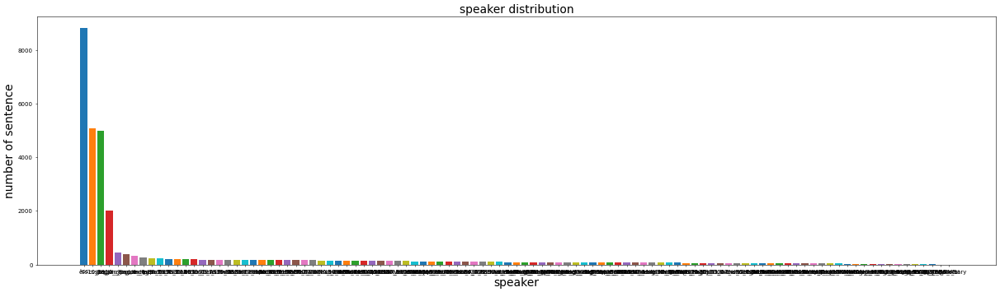

In [5]:
%matplotlib inline
from matplotlib import pyplot as plt

plt.figure(figsize=(30,8),dpi=50)
plt.title('speaker distribution',fontsize=20)
plt.xlabel('speaker',fontsize=20)
plt.ylabel('number of sentence',fontsize=20)
for i in data_num[1:]:
    plt.bar(i[0],i[1],align='center')
plt.show()

### 2. language distribution

In [6]:
lang_dict = {}
with open(file) as f:
    for data in f.readlines():
        data = data.split('|')
        if data[2] not in lang_dict:
            lang_dict[data[2]]=1
        else : lang_dict[data[2]]+=1

In [7]:
data_lang = sorted(lang_dict.items(),key= lambda x:-x[1])
data_lang

[('en', 13055), ('zh', 9401), ('ko', 8815), ('de', 5076), ('ja', 4981)]

In [9]:
%matplotlib inline

plot_data=[]
for i in data_lang:
    plot_data.append({"language":i[0],
                "number of sentence":i[1]})

pie = Plot("Pie")
pie.set_options({
    "height":300,
    "width":300,
    "appendPadding": 32,
    "data":plot_data,
    "angleField":"number of sentence",
    "colorField":"language",
    "radius": 1,
})
pie.render_notebook()

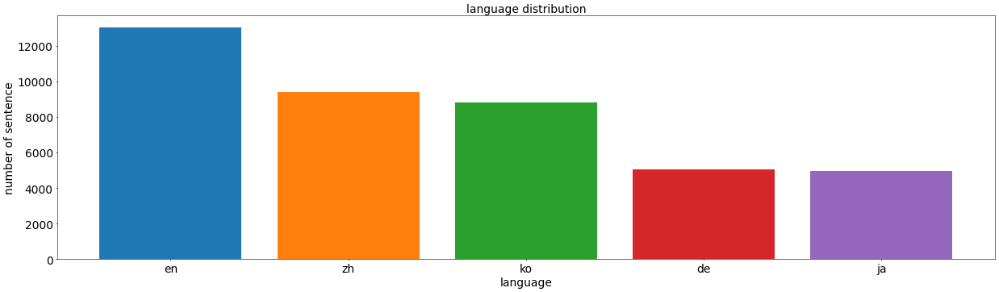

In [9]:
%matplotlib inline

plt.figure(figsize=(30,8),dpi=50)
plt.title('language distribution',fontsize=20)
plt.xlabel('language',fontsize=20)
plt.ylabel('number of sentence',fontsize=20)
plt.tick_params(labelsize=20)
for i in data_lang:
    plt.bar(i[0],i[1],align='center')

plt.show()